# Datasets

In [1]:
from src import data

#data_directory = '../../../../data/05_vocabs'
data_directory = '../../../../data/datasets/06_preprocessed'
datasets = data.dict_from_directory(data_directory, type='polars')
datasets_pandas = data.dict_from_directory(data_directory, type='pandas')

In [2]:
df = datasets['adhd']

# Label Distributions

In [3]:
import polars as pl

distributions = pl.DataFrame({
    'dataset': list(datasets.keys()),
    'rows': [len(datasets[dataset]) for dataset in datasets],
    'include': [len(datasets[dataset].filter(pl.col('include') == True)) for dataset in datasets],
    'exclude': [len(datasets[dataset].filter(pl.col('include') == False)) for dataset in datasets],
    'include %': [round(len(datasets[dataset].filter(pl.col('include') == True)) / len(datasets[dataset]), 4) * 100 for dataset in datasets],
    'exclude %': [round(len(datasets[dataset].filter(pl.col('include') == False)) / len(datasets[dataset]), 4) * 100 for dataset in datasets],
}).sort(by='include %')

print(distributions)

shape: (6, 6)
┌──────────────────────────┬───────┬─────────┬─────────┬───────────┬───────────┐
│ dataset                  ┆ rows  ┆ include ┆ exclude ┆ include % ┆ exclude % │
│ ---                      ┆ ---   ┆ ---     ┆ ---     ┆ ---       ┆ ---       │
│ str                      ┆ i64   ┆ i64     ┆ i64     ┆ f64       ┆ f64       │
╞══════════════════════════╪═══════╪═════════╪═════════╪═══════════╪═══════════╡
│ adhd                     ┆ 851   ┆ 20      ┆ 831     ┆ 2.35      ┆ 97.65     │
│ pancreatic_surgery       ┆ 34206 ┆ 2353    ┆ 31853   ┆ 6.88      ┆ 93.12     │
│ calcium_channel_blockers ┆ 1218  ┆ 100     ┆ 1118    ┆ 8.21      ┆ 91.79     │
│ atypical_antipsychotics  ┆ 1120  ┆ 146     ┆ 974     ┆ 13.04     ┆ 86.96     │
│ animal_depression        ┆ 1993  ┆ 280     ┆ 1713    ┆ 14.05     ┆ 85.95     │
│ oral_hypoglycemics       ┆ 503   ┆ 136     ┆ 367     ┆ 27.04     ┆ 72.96     │
└──────────────────────────┴───────┴─────────┴─────────┴───────────┴───────────┘


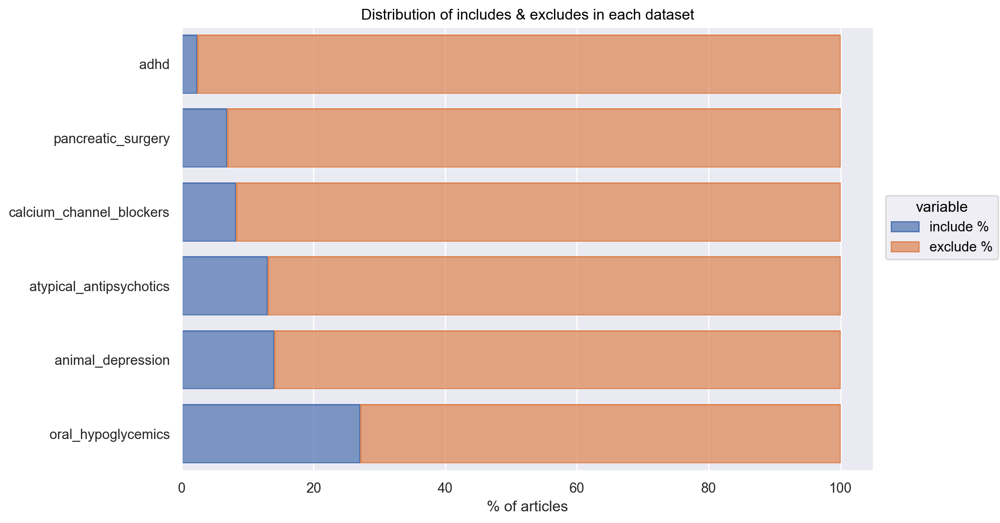

In [4]:
import seaborn.objects as so # grammar of graphics

melted = distributions.unpivot(
    index=['dataset'], 
    on=['include %', 'exclude %'],
    ).sort(by='value')

(
    so.Plot(data=melted, y='dataset', x='value', color='variable')
    .add(so.Bar(), so.Stack())
    .label(y='', x='% of articles', title='Distribution of includes & excludes in each dataset')
    .layout(size=(10, 6))
)

# Missing Data

In [5]:
data_directory_before = '../../../../data/031_schema'
datasets_before = data.dict_from_directory(data_directory_before, separator=',', type='pandas')

In [6]:
missing_percentages = lambda x: round(x.isna().mean() * 100, 2)

In [7]:
import pandas as pd

missings_before = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'preprocessing': 'before'
}for subject, df in datasets_before.items())


missings_after = pd.DataFrame({
    'dataset': subject,
    'title': missing_percentages(df['title']),
    'abstract': missing_percentages(df['abstract']),
    'preprocessing': 'after'
}for subject, df in datasets_pandas.items())

In [8]:
missings_joint = pd.concat([missings_before, missings_after])

missings_melted = pd.melt(missings_joint, id_vars=['dataset', 'preprocessing'], value_vars=['title', 'abstract'],
                        var_name='type', value_name='missing')
missings_melted.sort_values(by=['preprocessing'], ascending=True, inplace=True)

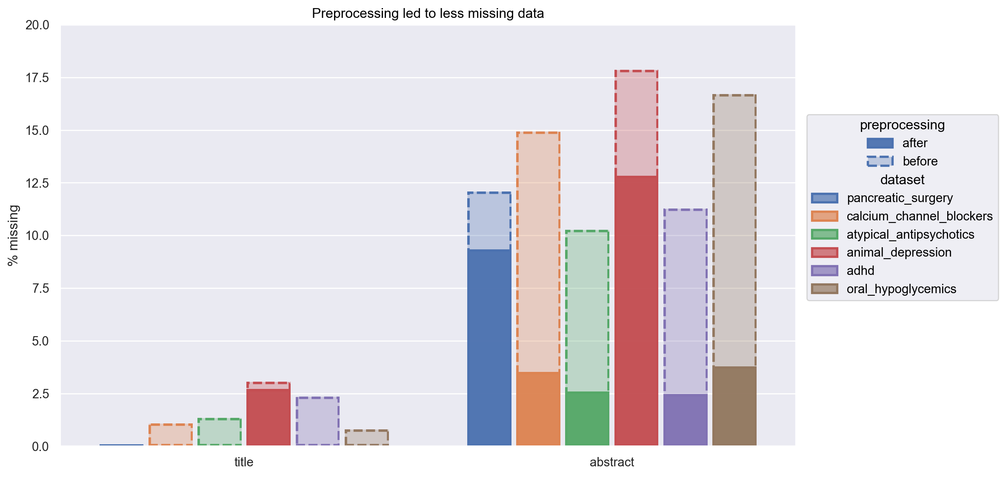

In [9]:
import seaborn.objects as so

(
    so.Plot(data=missings_melted, x='type', y='missing', alpha='preprocessing', edgestyle='preprocessing', color='dataset', text='missing')
    .add(so.Bar(edgewidth=2), so.Dodge(by=['color'], gap=0.1))
    #.add(so.Text({"fontweight": "bold"}, color='w', alpha=1), so.Dodge(by=['color']))
    .label(x='', y='% missing', title='Preprocessing led to less missing data', legend='Test')
    .scale()
    .layout(size=(10, 6))
    .limit(y=(0,20))
)

# Noise

## Languages
Specifically languages other than English.

In [10]:
import pandas as pd

fd = pd.concat([
    datasets['pancreatic_surgery'].to_pandas()[['abstract']].iloc[200],
    datasets['atypical_antipsychotics'].to_pandas()[['abstract']].iloc[99]
], axis=1).transpose()

fd

,abstract
200,zusammenfassung hintergrund die chronische pan...
99,ne phencyclidine pcp ne n methyl aspartate nmd...


## HTML

In [11]:
df = pd.concat([
    datasets_pandas['calcium_channel_blockers'][['abstract']].iloc[[24]],
    datasets_pandas['adhd'][['abstract']].iloc[[456, 565]]
])

df

,abstract
24,objective report atypical presentation lance a...
456,objective evaluate efficacy safety risperidone...
565,objective compare intraocular pressure iop low...


We can get rid of HTML using the Beautiful Soup library, e.g. the article with index 456 from above:

In [12]:
from bs4 import BeautifulSoup

BeautifulSoup(datasets_pandas['adhd'].iloc[456]['abstract'], 'lxml').get_text()

'objective evaluate efficacy safety risperidone child adult tourette syndrome method week randomize double blind placebo controlled trial primary outcome measure total tic score yale global tic severity scale ygtss result thirty four medication free subject child adult range age year mean year participate ygtss total tic score similar baseline risperidone v placebo week treatment mean daily dose subject risperidone show reduction tic severity baseline compare reduction placebo patient n f p child randomize risperidone show reduction tic symptom compare decrease child placebo f p two child risperidone show acute social phobia resolve dose reduction one subject result medication discontinuation mean increase body weight kg observe risperidone group compare change placebo f p extrapyramidal symptom clinically significant alteration cardiac conduction time laboratory measure observe conclusion risperidone appear safe effective short term treatment tic child adult tourette syndrome longer t

## Markdown

In [13]:
datasets_pandas['calcium_channel_blockers']['abstract'].iloc[[44]]

44    table content important medical profession pla...
Name: abstract, dtype: string

Markdown headings are defined by a number of subsequent '#'

Regular expressions can filter any sequence from zero to unlimited characters:

In [14]:
import re

no_headings = re.sub(r'(#)+', '', datasets_pandas['calcium_channel_blockers'].iloc[[44]]['abstract'].values[0])
no_headings

'table content important medical profession play significant role critically evaluate use diagnostic procedure therapy management prevention disease state rigorous expert analysis available data document relative benefit'

In [15]:
df = datasets_pandas['calcium_channel_blockers'].iloc[[44]][['abstract']]
df

,abstract
44,table content important medical profession pla...


## Special Characters

In [16]:
df = datasets_pandas['animal_depression'].iloc[190]['abstract']
df

'adult fisher rat subject unilateral impact dorsal cortex hippocampus second result mm cortical depression cause severe cortical damage neuronal loss hippocampus subfields ca ca hilus breakdown blood brain barrier bbb assess inject protein horseradish peroxidase hrp minute prior various time injury minute hour day animal kill hour hrp injection brain section react diaminobenzidine visualize extravascular accumulation protein maximum staining occur animal inject hrp minute prior minute cortical contusion stain time point observe ipsilateral cortex impact area area adjacent well ipsilateral hippocampus modest staining occur dorsal contralateral cortex near superior sagittal sinus cortical hrp stain gradually decrease increase time interval postinjury day hrp staining observe area brain ipsilateral hippocampus hrp staining absent hour postinjury remain hour time point surprisingly hrp staining observe ipsilateral hippocampus day cortical contusion indicate biphasic opening bbb follow head

## Abbreviations

In [17]:
datasets_pandas['pancreatic_surgery'].iloc[[1,6,249]][['abstract']]

,abstract
1,importance diagnostic endoscopic retrograde ch...
6,introduction pancreaticopleural fistula ppf ra...
249,intravenous radionuclide cholescintigraphy ivr...


In [18]:
remove_abbreviations = r'(\([A-Z]{2,}\))'# at least two uppercase letters in parentheses
sample = datasets_pandas['pancreatic_surgery'].iloc[[249]]['abstract'].values[0]

re.sub(remove_abbreviations, '', sample)

'intravenous radionuclide cholescintigraphy ivrc provide specific picture choledochal cyst however clinical significance non visualization gall bladder gb activity case unclear study review patient choledochal cyst undergo ivrc within day prior operation correlate gb finding ivrc histopathological result patient non visualization gb h post injection among two histopathological feature acute cholecystitis ac chronic cholecystitis cc five normal gb nine patient visualization gb five case cc four normal gb apply finding non visualization gb h post injection criterion diagnosis ac diagnostic accuracy conclude gb disease ac cc common respectively choledochal cyst patient non visualization gb ivrc necessarily indicate ac choledochal cyst case diagnostic accuracy low gb disease cause gb non visualization ivrc huge choledochal cyst cause mass reservoir effect may cause gb compression result non visualization gb'

## Paragraph Labels

In [19]:
datasets['atypical_antipsychotics'].to_pandas().iloc[[24]]['abstract'].to_string()

'24    rationale atypical neuroleptic clozapine induc...'

# Duplicates
There appear many duplicates when searching for articles with the same title. There are however different cases that require individual handling:

### Same article published twice
The following example shows an identical article that was published twice. Because the two articles are identical, we can safely delete one of them.

In [20]:
#datasets_pandas['pancreatic_surgery'].drop(columns=['Unnamed: 0']).iloc[[12250,12322]]

### Same title but different articles
Another case are articles that share a title but are clearly distinguishable through their content, doi and literature id. As those two articles differ in content, we try to keep both.

In [21]:
datasets['oral_hypoglycemics'].to_pandas().iloc[[178,179]]

,include,title,abstract,first_author,year,journal,doi,pubmed_id,authors,pubmed_type,...,mesh,webofscience_id,central_id,openalex_id,title_length,title_word_count,title_sentence_count,abstract_length,abstract_word_count,abstract_sentence_count
178,False,oral antihyperglycemic therapy type diabetes,diabetes mellitus affect u population great ma...,Inzucchi SE,2002,JAMA,https://doi.org/10.1001/jama.287.3.360,11790216,Inzucchi SE,article,...,"D000284: Administration, Oral; D001645: Biguan...",None,None,https://openalex.org/W2069150029,50,7,1,1331,222,6
179,False,oral antihyperglycemic therapy type diabetes,oral agent mainstay pharmacologic treatment ty...,Holmboe ES,2002,JAMA,https://doi.org/10.1001/jama.287.3.373,11790217,Holmboe ES,article,...,D000368: Aged; D001645: Biguanides; D015897: C...,None,None,https://openalex.org/W1988203022,50,7,1,976,149,7


# Word Frequencies

In [22]:
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, ImageColorGenerator
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from typing import List

In [23]:
def word_cloud_from_dataframe(dataframe: pd.DataFrame, columns=List[str] ):
    corpus = ' '.join([word for column in columns for word in dataframe[column] if word is not None])

    # stop words
    stop_words = stopwords.words('english')
    special_characters = ['.', ',', '(', ')', '[', ']', '{', '}', ':', ';', '?', '!', '@', '#', '$', '%', '^', '&', '*', '+', '=', '<', '>', '/', '\\', '|', '~', '`', '_', '-']
    stop_words.extend(special_characters)

    # custom stop words
    custom_stop_words = ['patient', 'treatment', 'study', 'group', 'effect', 'p', 'mg', 'conclusion', 'day', 'week', 'result', 'compared', 'use', 'one', 'also', 'two', 'may', 'level', 'however', 'm', 'd', 'period', 'n']

    # tokenization
    word_tokens = word_tokenize(corpus.lower())

    # remove stop words
    filtered = [word for word in word_tokens if word not in stop_words]

    # lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized = [lemmatizer.lemmatize(word) for word in filtered]

    

    return WordCloud(
    scale=20,
    collocations=False, # whether to includes bigrams
    background_color=None,
    stopwords=custom_stop_words,
    mode='RGBA',
    ).generate_from_text(' '.join(lemmatized))

In [24]:
import matplotlib.pyplot as plt

def plot_word_cloud(cloud, title=''):
    plt.figure(figsize=(10, 10), dpi=400)
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

In [25]:
adhd = datasets['adhd']
animal_depression = datasets['animal_depression']
atypical_antipsychotics = datasets['atypical_antipsychotics']
calcium_channel_blockers = datasets['calcium_channel_blockers']
oral_hypoglycemics = datasets['oral_hypoglycemics']
pancreatic_surgery = datasets['pancreatic_surgery']

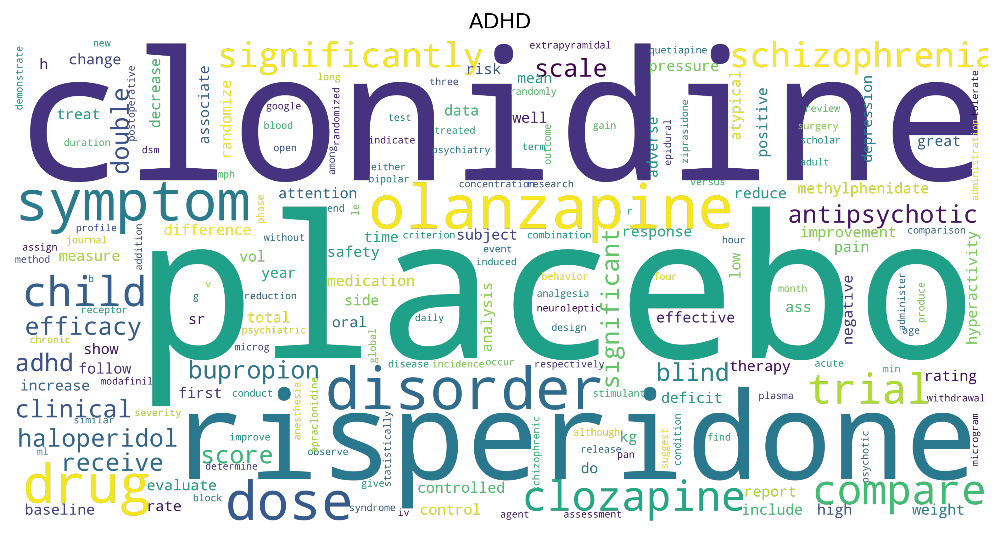

In [26]:
adhd_cloud = word_cloud_from_dataframe(adhd, columns=['title', 'abstract'])
plot_word_cloud(adhd_cloud, 'ADHD')

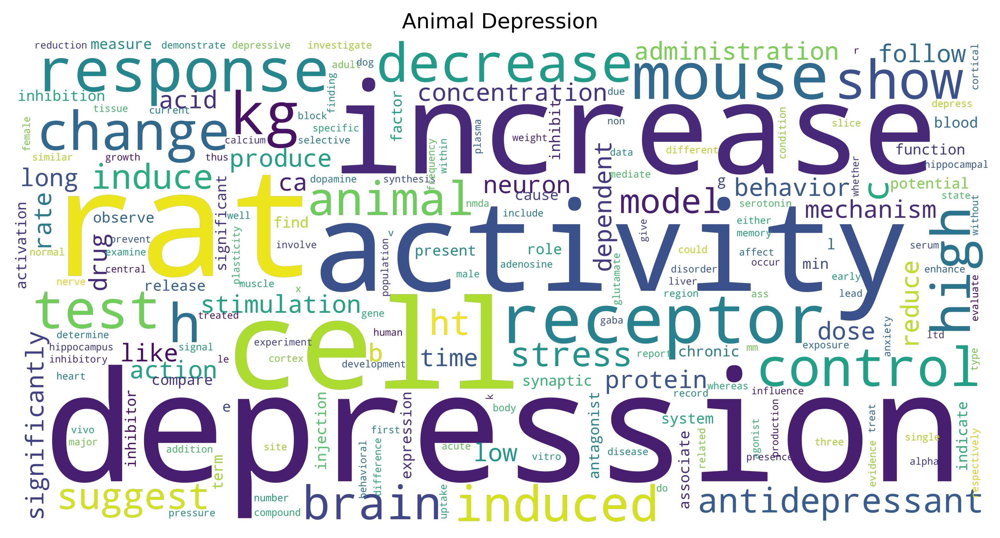

In [27]:
animal_depression_cloud = word_cloud_from_dataframe(animal_depression, columns=['title', 'abstract'])
plot_word_cloud(animal_depression_cloud, 'Animal Depression')

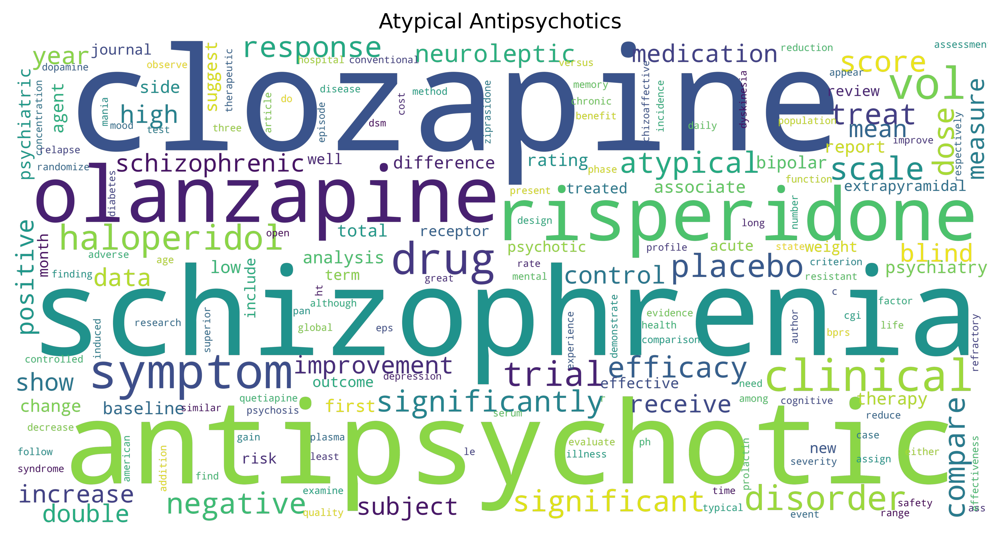

In [28]:
atypical_antipsychotics_cloud = word_cloud_from_dataframe(atypical_antipsychotics, columns=['title', 'abstract'])
plot_word_cloud(atypical_antipsychotics_cloud, 'Atypical Antipsychotics')

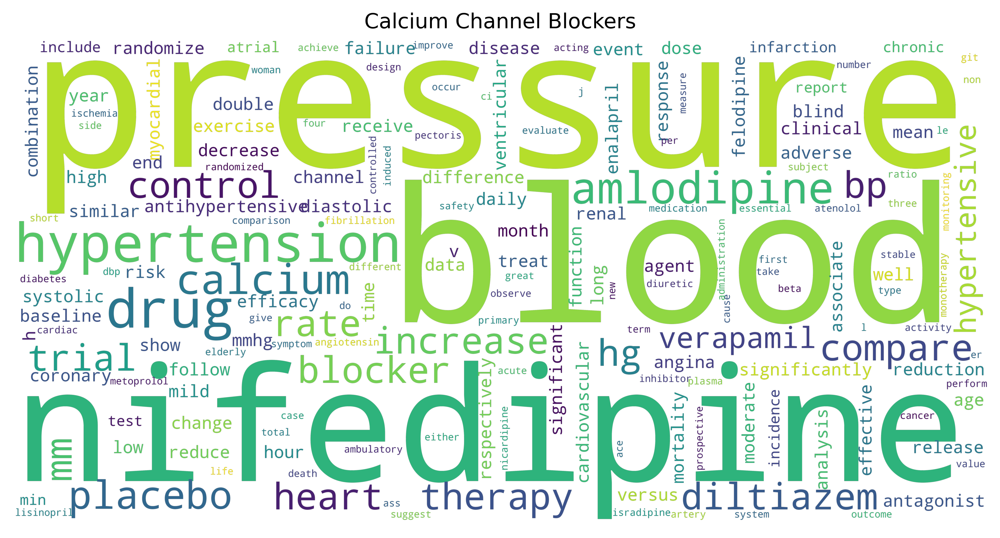

In [29]:
calcium_channel_blockers_cloud = word_cloud_from_dataframe(calcium_channel_blockers, columns=['title', 'abstract'])
plot_word_cloud(calcium_channel_blockers_cloud, 'Calcium Channel Blockers')

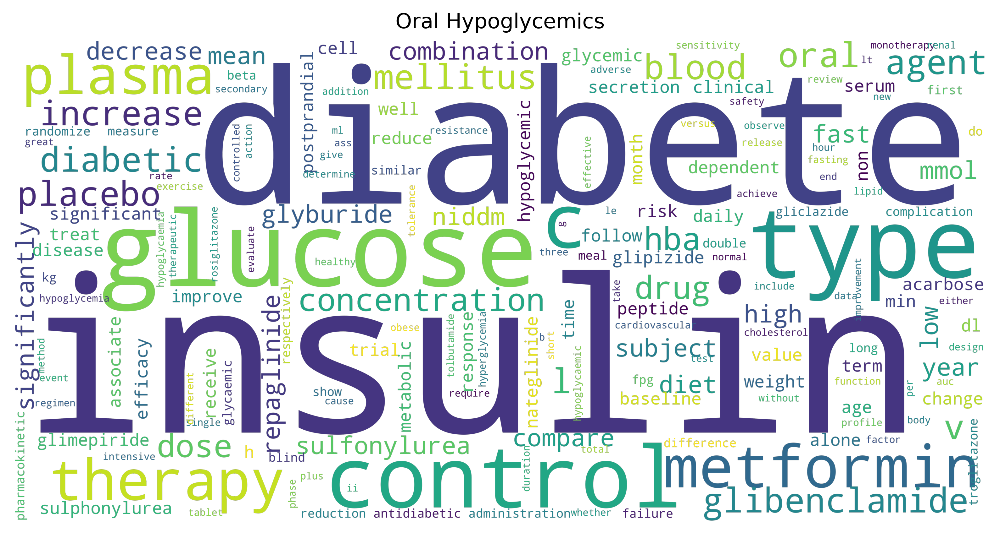

In [30]:
oral_hypoglycemics_cloud = word_cloud_from_dataframe(oral_hypoglycemics, columns=['title', 'abstract'])
plot_word_cloud(oral_hypoglycemics_cloud, 'Oral Hypoglycemics')

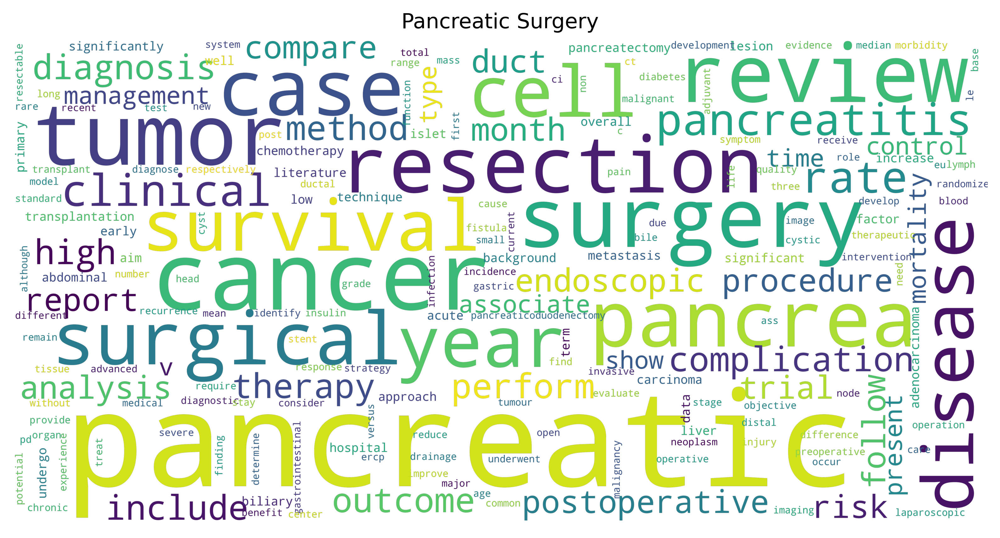

In [31]:
pancreatic_surgery_cloud = word_cloud_from_dataframe(pancreatic_surgery, columns=['title', 'abstract'])
plot_word_cloud(pancreatic_surgery_cloud, 'Pancreatic Surgery')

# Word Counts

TODO